In [1]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload


import os
os.chdir("/home/csartori/GNN_E")


from scripts.utils import *

import pandas as pd
from math import ceil
import gc
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


/home/csartori/GNN_E/.venv/lib/python3.8/site-packages/torch/__config__.py:10: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11060). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._show_config()


In [ ]:
import os

# List all files in the current folder
for file in os.listdir("."):  # "." refers to the current directory
    print(file)

ml-students_LabProjects.pdf
README.md
notebook_ssh.md
.gitignore
project2_description.pdf


In [4]:
# Load all movies with labels csv
df_all_movies = pd.read_csv("/home/dalai/GNN_E/data/processed/all_movies_labelled_13_single.csv")
num_classes = 13  # Based on the dataset
batch_size = 32  # Batch size is not relevant for KNN, but kept for reference

In [6]:
# Load rest dataset (not used directly in this script)
df_rest = pd.read_csv("/home/dalai/GNN_E/data/raw/rest/Rest_compiled414_processed.csv")

In [7]:
import os

# List all files in the current folder
for file in os.listdir("."):  # "." refers to the current directory
    if os.path.isfile(file):  # Check if it's a file (not a folder)
        print(file)

ml-students_LabProjects.pdf
README.md
notebook_ssh.md
.gitignore
project2_description.pdf


In [8]:
os.chdir("/home/csartori/GNN_E")


# Split in train and test
df_train, df_val, df_test = split_train_val_test_horizontally(
    df_all_movies,
    percentage_train=0.8,
    percentage_val=0.0,  # 0 to not have any validation set
    path_pickle_delay="data/raw/labels/run_onsets.pkl",
    path_movie_title_mapping="data/raw/labels/category_mapping_movies.csv",
    tr_len=1.3,
)

# Print label distributions for sanity checking
print(df_train[df_train.label != -1]["label"].count() / 414)
print(df_test[df_test.label != -1]["label"].count() / 414)


Movie: AfterTheRain
  Start Time (TR)+4: 80
  Total Length (TR): 382
  Train End (TR): 385
  Validation End (TR): 385
  Movie End (TR): 462

Movie: BetweenViewings
  Start Time (TR)+4: 79
  Total Length (TR): 622
  Train End (TR): 576
  Validation End (TR): 576
  Movie End (TR): 701

Movie: BigBuckBunny
  Start Time (TR)+4: 79
  Total Length (TR): 377
  Train End (TR): 380
  Validation End (TR): 380
  Movie End (TR): 456

Movie: Chatter
  Start Time (TR)+4: 79
  Total Length (TR): 312
  Train End (TR): 328
  Validation End (TR): 328
  Movie End (TR): 391

Movie: FirstBite
  Start Time (TR)+4: 79
  Total Length (TR): 461
  Train End (TR): 447
  Validation End (TR): 447
  Movie End (TR): 540

Movie: LessonLearned
  Start Time (TR)+4: 79
  Total Length (TR): 513
  Train End (TR): 489
  Validation End (TR): 489
  Movie End (TR): 592

Movie: Payload
  Start Time (TR)+4: 79
  Total Length (TR): 775
  Train End (TR): 699
  Validation End (TR): 699
  Movie End (TR): 854

Movie: Sintel
  Start

In [9]:


half_wind_size = 4

# Create features and labels
X_train, y_train = create_feature_label_tensors_for_FNN(df_train, sizewind=half_wind_size)
X_test, y_test = create_feature_label_tensors_for_FNN(df_test, sizewind=half_wind_size)

# Reshape features to (samples, nodes * window)
X_train = X_train.view(X_train.shape[0], -1).numpy()
X_test = X_test.view(X_test.shape[0], -1).numpy()
y_train = y_train.numpy()
y_test = y_test.numpy()

Movies in this df: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Processing movie: 0, subject: 1, timepoint: 0/306
Processing movie: 0, subject: 1, timepoint: 1/306
Processing movie: 0, subject: 1, timepoint: 2/306
Processing movie: 0, subject: 1, timepoint: 3/306
Processing movie: 0, subject: 1, timepoint: 4/306
Processing movie: 0, subject: 1, timepoint: 5/306
Processing movie: 0, subject: 1, timepoint: 6/306
Processing movie: 0, subject: 1, timepoint: 7/306
Processing movie: 0, subject: 1, timepoint: 8/306
Processing movie: 0, subject: 1, timepoint: 9/306
Processing movie: 0, subject: 1, timepoint: 10/306
Processing movie: 0, subject: 1, timepoint: 11/306
Processing movie: 0, subject: 1, timepoint: 12/306
Processing movie: 0, subject: 1, timepoint: 13/306
Processing movie: 0, subject: 1, timepoint: 14/306
Processing movie: 0, subject: 1, timepoint: 15/306
Processing movie: 0, subject: 1, timepoint: 16/306
Processing movie: 0, subject: 1, timepoint: 17/306
Processing movie: 0, subject:

In [10]:
# Normalize features for KNN
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [11]:
# Create and train KNN model
k = 5  # Number of neighbors
knn_model = KNeighborsClassifier(n_neighbors=k)
knn_model.fit(X_train, y_train)

KNeighborsClassifier()

In [12]:
# Predict on test data
y_test_pred = knn_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_test_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 8.70%


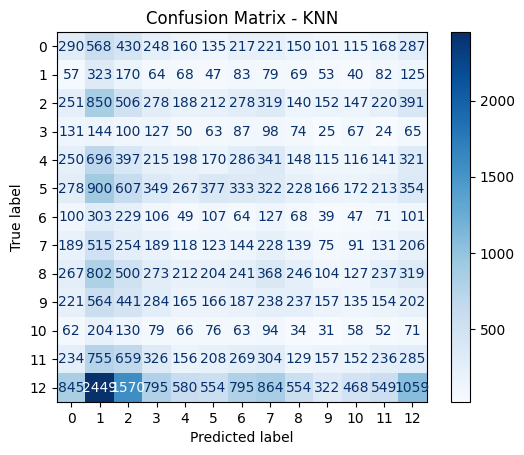

In [13]:
# Plot confusion matrix (optional)
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(knn_model, X_test, y_test, cmap="Blues")
plt.title("Confusion Matrix - KNN")
plt.show()